In [1]:
# Standard data science libraries
import pandas as pd
import datetime as dt
import numpy as np
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_seq_items = 14000
pd.options.display.max_rows = 14000

# Display all cell outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('bmh')

In [2]:
#Reading the csv file
raw_data= pd.read_csv("Data_Level4_UMDOTS_CampusTrafficCount.csv")

In [3]:
#Analyzing the data file
raw_data.head()

,time,pedestrians,bicyclists,cars,buses,trucks,location
0,2019-10-28T00:00:00-04:00,0,0,0,0,0,Campus_Dr_&_Presidential_Ave
1,2019-10-28T00:15:00-04:00,0,0,0,0,0,Campus_Dr_&_Presidential_Ave
2,2019-10-28T00:30:00-04:00,0,0,0,0,0,Campus_Dr_&_Presidential_Ave
3,2019-10-28T00:45:00-04:00,0,0,0,0,0,Campus_Dr_&_Presidential_Ave
4,2019-10-28T01:00:00-04:00,0,0,0,0,0,Campus_Dr_&_Presidential_Ave


In [4]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13480 entries, 0 to 13479
Data columns (total 7 columns):
time           13480 non-null object
pedestrians    13480 non-null int64
bicyclists     13480 non-null int64
cars           13480 non-null int64
buses          13480 non-null int64
trucks         13480 non-null int64
location       13480 non-null object
dtypes: int64(5), object(2)
memory usage: 737.3+ KB


### Data Analysis:
####  "time" and "location" are in object format for the raw_data file.

### Feature Extraction

#### - First extract the time and date from the "time". 
#### - It is seen earlier that the data type of time is object. So first of all, changing the data type to datetime format otherwise we can not extract features from it.


In [5]:
#Converting timestamp to date and time columns
raw_data['time'] = raw_data['time'].apply(lambda x : pd.to_datetime(str(x)))
raw_data['date'] = raw_data['time'].dt.date
raw_data['Timing'] = raw_data['time'].dt.time
# raw_data['year']=i.Datetime.dt.year 


In [6]:
raw_data['month']=raw_data['time'].dt.month 
raw_data['day']=raw_data['time'].dt.day
raw_data['Hour']=raw_data['time'].dt.hour 

In [ ]:
# raw_data

In [ ]:
#Dropping the time stamp column
# raw_data= raw_data.drop('time', axis=1)

In [9]:
#Dataframe cleaning 
raw_data.columns = map(str.upper, raw_data.columns)
# raw_data

In [10]:
locations= raw_data['LOCATION'].unique()

In [11]:
print(len(locations))

10


### Hence, we know that there are 10 locations to consider
#### - 97 entries per day for 1 location
#### - 14 days covered in total
#### - 10 locations present

In [8]:
# The last 4 entries in the data set are for 11th November 2019, and we are concerned only with the range 10/28/2019 to 11/10/2019. 
# Hence, these rows can be eliminated.
raw_data.drop(raw_data.tail(4).index,inplace=True) # drop last 4 rows

In [ ]:
# raw_data

In [12]:
raw_data = raw_data[['TIME','DATE','TIMING','MONTH','DAY','HOUR','LOCATION', 'PEDESTRIANS', 'BICYCLISTS','CARS','BUSES','TRUCKS']]

In [ ]:
# raw_data

In [ ]:
# saving the dataframe 
# raw_data.to_csv('file1.csv') 

In [13]:
raw_data['LOCATION'].unique()

array(['Campus_Dr_&_Presidential_Ave', 'Campus_Dr_At_Paint_Branch_Dr',
       'Paint_Branch_Dr_At_Campus_Dr', 'Regents_Dr_&_Stadium_Dr_1',
       'Regents_Dr_&_Stadium_Dr_2', 'Regents_Dr_&_Stadium_Dr_3',
       'South_Gate_Northern_View', 'South_Gate_South_View',
       'Stadium_Dr_East_Of_Regents_Dr',
       'University_Blvd_&_Paint_Branch_Dr'], dtype=object)

In [ ]:
# # Adding latitudes and longitude values
# raw_data['LATITUDE'] = ['38.985440' if x == 'Campus_Dr_&_Presidential_Ave' else '0' for x in raw_data['LOCATION']]
# raw_data['LONGITUDE'] = ['-76.954820' if x == 'Campus_Dr_&_Presidential_Ave' else '0' for x in raw_data['LOCATION']]


### Some of the latitudes and longitude values have been adjusted here.
#### This was done so that individual points can be seen on the map, otherwise they were overlapping.

In [14]:
latitudes= []
longitudes= []
for row in raw_data['LOCATION']:
    if row == 'Campus_Dr_&_Presidential_Ave': 
        latitudes.append('38.985440')
        longitudes.append('-76.954820')
    elif row == 'Regents_Dr_&_Stadium_Dr_1': 
        latitudes.append('38.990167')
        longitudes.append('-76.940528')
    elif row == 'Regents_Dr_&_Stadium_Dr_2': 
        latitudes.append('38.990417')
        longitudes.append('-76.940639')
    elif row == 'University_Blvd_&_Paint_Branch_Dr': 
        latitudes.append('32.311570')
        longitudes.append('-95.256740')
    elif row == 'Regents_Dr_&_Stadium_Dr_3': 
        latitudes.append('38.990940')
        longitudes.append('-76.940641')
    elif row == 'South_Gate_Northern_View': 
        latitudes.append('38.982272')
        longitudes.append('-76.938342')
    elif row == 'South_Gate_South_View': 
        latitudes.append('38.982392')
        longitudes.append('-76.938562')
    elif row == 'Campus_Dr_At_Paint_Branch_Dr': 
        latitudes.append('38.988688')
        longitudes.append('-76.936471')
    elif row == 'Paint_Branch_Dr_At_Campus_Dr': 
        latitudes.append('38.988978')
        longitudes.append('-76.936661')
    elif row == 'Stadium_Dr_East_Of_Regents_Dr': 
        latitudes.append('38.990697')
        longitudes.append('-76.940828')
    else:
        latitudes.append('0')
        longitudes.append('0')

In [15]:
raw_data['LATITUDE'] = latitudes
raw_data['LONGITUDE'] = longitudes

In [ ]:
# raw_data

In [ ]:
# raw_data.to_csv('File 2.csv')

## Data frame for Correllation Matrix

### 1. Weekend factor

In [19]:
raw_data['DAY_OF_WEEK']=raw_data['TIME'].dt.dayofweek 
# temp = train['Datetime']

#### 0-4 represent Monday to Friday respectively
#### 5 and 6 represent Saturday and Sunday
#### Weekend = 1 
#### Weekday = 0
#### DAY_OF_WEEK can be removed from dataframe now

In [21]:
def applyer(row):
    if row.dayofweek == 5 or row.dayofweek == 6:
        return 1
    else:
        return 0 
temp = raw_data['TIME'].apply(applyer) 
raw_data['WEEKEND']=temp

In [23]:
raw_data['WEEKEND'].value_counts()

0    9636
1    3840
Name: WEEKEND, dtype: int64

In [25]:
weekend_vs_weekday_df= raw_data.copy()

<Figure size 1152x576 with 0 Axes>

Text(0.5, 1.0, 'Time Series')

Text(0.5, 0, 'Time')

Text(0, 0.5, 'Pedestrian count')

(array([737361., 737363., 737364., 737366., 737368., 737370., 737372.,
        737374.]), <a list of 8 Text xticklabel objects>)

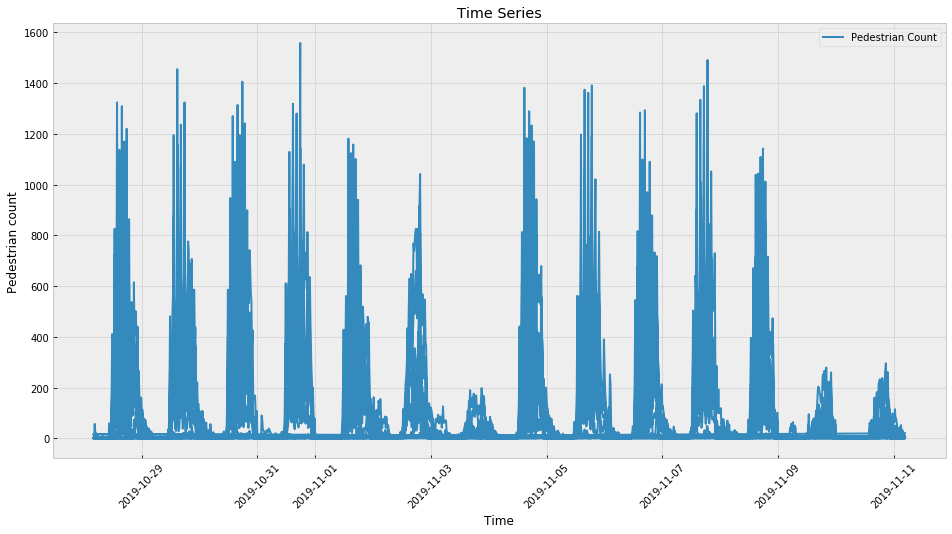

In [30]:
weekend_vs_weekday_df.index = weekend_vs_weekday_df['TIME'] # indexing the Datetime to get the time period on the x-axis. 
# weekend_vs_weekday_df=weekend_vs_weekday_df.drop('ID',1)           # drop ID variable to get only the Datetime on x-axis. 
ts = weekend_vs_weekday_df['PEDESTRIANS'] 
plt.figure(figsize=(16,8)) 
plt.plot(ts, label='Pedestrian Count') 
plt.title('Time Series') 
plt.xlabel("Time") 
plt.ylabel("Pedestrian count") 
plt.xticks(rotation=45)
plt.legend(loc='best')

#### Plot shows that for every 6th and 7th day in a week, which are the Weekend days, a steep drop in pedetrian counts can be observed. This supports our hypothesis.

### 2. Campus schedule addition

In [31]:
correlation_df= weekend_vs_weekday_df.copy()

In [32]:
correlation_df

,TIME,DATE,TIMING,MONTH,DAY,HOUR,LOCATION,PEDESTRIANS,BICYCLISTS,CARS,BUSES,TRUCKS,LATITUDE,LONGITUDE,DAY_OF_WEEK,WEEKEND
TIME,,,,,,,,,,,,,,,,
2019-10-28 00:00:00-04:00,2019-10-28 00:00:00-04:00,2019-10-28,00:00:00,10,28,0,Campus_Dr_&_Presidential_Ave,0,0,0,0,0,38.985440,-76.954820,0,0
2019-10-28 00:15:00-04:00,2019-10-28 00:15:00-04:00,2019-10-28,00:15:00,10,28,0,Campus_Dr_&_Presidential_Ave,0,0,0,0,0,38.985440,-76.954820,0,0
2019-10-28 00:30:00-04:00,2019-10-28 00:30:00-04:00,2019-10-28,00:30:00,10,28,0,Campus_Dr_&_Presidential_Ave,0,0,0,0,0,38.985440,-76.954820,0,0
2019-10-28 00:45:00-04:00,2019-10-28 00:45:00-04:00,2019-10-28,00:45:00,10,28,0,Campus_Dr_&_Presidential_Ave,0,0,0,0,0,38.985440,-76.954820,0,0
2019-10-28 01:00:00-04:00,2019-10-28 01:00:00-04:00,2019-10-28,01:00:00,10,28,1,Campus_Dr_&_Presidential_Ave,0,0,0,0,0,38.985440,-76.954820,0,0
2019-10-28 01:15:00-04:00,2019-10-28 01:15:00-04:00,2019-10-28,01:15:00,10,28,1,Campus_Dr_&_Presidential_Ave,0,0,0,0,0,38.985440,-76.954820,0,0
2019-10-28 01:30:00-04:00,2019-10-28 01:30:00-04:00,2019-10-28,01:30:00,10,28,1,Campus_Dr_&_Presidential_Ave,0,0,1,0,0,38.985440,-76.954820,0,0
2019-10-28 01:45:00-04:00,2019-10-28 01:45:00-04:00,2019-10-28,01:45:00,10,28,1,Campus_Dr_&_Presidential_Ave,0,0,0,0,0,38.985440,-76.954820,0,0
2019-10-28 02:00:00-04:00,2019-10-28 02:00:00-04:00,2019-10-28,02:00:00,10,28,2,Campus_Dr_&_Presidential_Ave,0,0,1,0,0,38.985440,-76.954820,0,0


In [ ]:
if correlation_df['DAY_OF_WEEK'] == 1 or correlation_df['DAY_OF_WEEK'] == 3:
    for i in correlation_df['TIMING']:
        if 
        correlation_df['PRIMETIME']= 

## Data frame for Map in Tableau- Location and Hour wise filtering

In [16]:
df_for_map = raw_data.groupby(['LOCATION','DATE','HOUR',"LATITUDE",'LONGITUDE'],as_index=False)[['PEDESTRIANS','BICYCLISTS','CARS','BUSES','TRUCKS']].sum()

### The following dataframe is the data set used for our Tableau visualisation. 
#### Each row in the dataframe holds the sum value of pedestrians, bicyclists, cars, buses and trucks for the 
#### 0th, 15th, 30th and 45th minute of the hour

In [17]:
df_for_map

,LOCATION,DATE,HOUR,LATITUDE,LONGITUDE,PEDESTRIANS,BICYCLISTS,CARS,BUSES,TRUCKS
0,Campus_Dr_&_Presidential_Ave,2019-10-28,0,38.985440,-76.954820,0,0,0,0,0
1,Campus_Dr_&_Presidential_Ave,2019-10-28,1,38.985440,-76.954820,0,0,1,0,0
2,Campus_Dr_&_Presidential_Ave,2019-10-28,2,38.985440,-76.954820,0,0,2,0,0
3,Campus_Dr_&_Presidential_Ave,2019-10-28,3,38.985440,-76.954820,0,0,0,0,0
4,Campus_Dr_&_Presidential_Ave,2019-10-28,4,38.985440,-76.954820,0,0,0,0,0
5,Campus_Dr_&_Presidential_Ave,2019-10-28,5,38.985440,-76.954820,2,3,2,0,0
6,Campus_Dr_&_Presidential_Ave,2019-10-28,6,38.985440,-76.954820,2,0,8,0,0
7,Campus_Dr_&_Presidential_Ave,2019-10-28,7,38.985440,-76.954820,7,1,339,15,16
8,Campus_Dr_&_Presidential_Ave,2019-10-28,8,38.985440,-76.954820,23,1,522,14,13
9,Campus_Dr_&_Presidential_Ave,2019-10-28,9,38.985440,-76.954820,28,7,609,14,17


In [18]:
# df_for_map.to_csv('Data_File.csv')